In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)


from pathlib import Path
from xml.dom.minidom import parse
from shutil import copyfile
import os

In [ ]:
import os
dirPath = '/content/drive/MyDrive/CHV_Data/'
for dirname, subDirectories, filenames in os.walk(dirPath):
  print(filenames)

In [ ]:
from zipfile import ZipFile
with ZipFile('/content/drive/MyDrive/CHV_Data/d.zip','r') as zipObj:
  zipObj.extractall('/content/drive/MyDrive/CHV_Data/archive')

In [ ]:
with open('/content/drive/MyDrive/CHV_Data/archive/annotations/ppe_0000.txt') as f:
    contents = f.read()
    print(contents)

5 0.338125 0.236398 0.086250 0.086304
0 0.346250 0.487805 0.105000 0.607880



In [ ]:
from sklearn.model_selection import train_test_split
image_list = os.listdir('/content/drive/MyDrive/CHV_Data/archive/images')
train_list, test_list = train_test_split(image_list, test_size=0.3, random_state=42)
val_list, test_list = train_test_split(test_list, test_size=0.6, random_state=42)
print('total =',len(image_list))
print('train :',len(train_list))
print('val   :',len(val_list))
print('test  :',len(test_list))

total = 1330
train : 931
val   : 159
test  : 240


In [ ]:

os.mkdir("/content/drive/MyDrive/CHV_Data/data/")
os.mkdir('/content/drive/MyDrive/CHV_Data/data/train')
os.mkdir('/content/drive/MyDrive/CHV_Data/data/val')
os.mkdir('/content/drive/MyDrive/CHV_Data/data/test')
os.mkdir('/content/drive/MyDrive/CHV_Data/data/train/images')
os.mkdir('/content/drive/MyDrive/CHV_Data/data/train/labels')
os.mkdir('/content/drive/MyDrive/CHV_Data/data/test/images')
os.mkdir('/content/drive/MyDrive/CHV_Data/data/test/labels')
os.mkdir('/content/drive/MyDrive/CHV_Data/data/val/images')
os.mkdir('/content/drive/MyDrive/CHV_Data/data/val/labels')


In [ ]:
metarial = []

for i in os.listdir("/content/drive/MyDrive/CHV_Data/archive/images"):
    srt = i[:-4]
    metarial.append(srt)

In [ ]:
len(metarial)

1330

In [ ]:
import xml.etree.cElementTree as ET
import glob
import os
import json
import random
import shutil

In [ ]:

def preparinbdata(main_txt_file, main_img_file, train_size, test_size, val_size):
    
    for i in range(0,train_size):
        
        source_txt = main_txt_file + "/" + metarial[i] + ".txt"
        source_img = main_img_file + "/" + metarial[i] + ".jpg"
        
        mstring = metarial[i]
        train_destination_txt = "/content/drive/MyDrive/CHV_Data/data/train/labels" + "/" + metarial[i] + ".txt" 
        train_destination_png = "/content/drive/MyDrive/CHV_Data/data/train/images" + "/" + metarial[i] + ".jpg" 
                
        shutil.copy(source_txt, train_destination_txt)
        shutil.copy(source_img, train_destination_png)
                
        #metarial.remove(file_name[:-4])
                
                
    for l in range(train_size , train_size + test_size):
        
        source_txt = main_txt_file + "/" + metarial[l] + ".txt"
        source_img = main_img_file + "/" + metarial[l] + ".jpg"
        
        mstring = metarial[l]
        test_destination_txt = "/content/drive/MyDrive/CHV_Data/data/test/labels" + "/" + metarial[l] + ".txt"
        test_destination_png = "/content/drive/MyDrive/CHV_Data/data/test/images" + "/" + metarial[l] + ".jpg"
                
        shutil.copy(source_txt, test_destination_txt)
        shutil.copy(source_img, test_destination_png)
                
        #metarial.remove(file_name[:-4])
                
                
    for n in range(train_size + test_size , train_size + test_size + val_size):
        
        source_txt = main_txt_file + "/" + metarial[n] + ".txt"
        source_img = main_img_file + "/" + metarial[n] + ".jpg"
        
        mstring = metarial[n]
        val_destination_txt = "/content/drive/MyDrive/CHV_Data/data/val/labels" + "/" + metarial[n] + ".txt"
        val_destination_png = "/content/drive/MyDrive/CHV_Data/data/val/images" + "/" + metarial[n] + ".jpg"
                
        shutil.copy(source_txt, val_destination_txt)
        shutil.copy(source_img, val_destination_png)
                
        #metarial.remove(file_name[:-4])

In [ ]:
#creating yaml
preparinbdata("/content/drive/MyDrive/CHV_Data/archive/annotations", "/content/drive/MyDrive/CHV_Data/archive/images",931 , 240, 159)

In [ ]:
# configure .yaml file to guide the model for training
%cd /content/data

yaml_text = """train: /content/drive/MyDrive/CHV_Data/data/train/images
val: /content/drive/MyDrive/CHV_Data/data/val/images

nc: 6
names: ["person","vest","blue_helmet","red_helmet","white_helmet","yellow_helmet"]"""


with open("/content/drive/MyDrive/CHV_Data/data/data.yaml", 'w') as file:
    file.write(yaml_text)

[Errno 2] No such file or directory: '/content/data'
/content


In [ ]:
with open('/content/drive/MyDrive/CHV_Data/data/data.yaml') as f:
    contents = f.read()
    print(contents)

train: /content/drive/MyDrive/CHV_Data/data/train/images
val: /content/drive/MyDrive/CHV_Data/data/val/images

nc: 6
names: ["person","vest","blue_helmet","red_helmet","white_helmet","yellow_helmet"]


In [ ]:
%cd /content/drive/MyDrive/CHV_Data/

/content/drive/MyDrive/CHV_Data


In [ ]:
# Download YOLOv7 code
!git clone https://github.com/WongKinYiu/yolov7

fatal: destination path 'yolov7' already exists and is not an empty directory.


In [ ]:
%cd yolov7/


/content/drive/MyDrive/CHV_Data/yolov7


In [ ]:
!ls

cfg	    inference	      runs	       utils	     yolov7.pt.5
data	    LICENSE.md	      scripts	       yolov7.pt     yolov7.pt.6
deploy	    models	      test.py	       yolov7.pt.1   yolov7.pt.7
detect.py   paper	      tools	       yolov7.pt.10  yolov7.pt.8
export.py   __pycache__       traced_model.pt  yolov7.pt.2   yolov7.pt.9
figure	    README.md	      train_aux.py     yolov7.pt.3
hubconf.py  requirements.txt  train.py	       yolov7.pt.4


In [ ]:
%pip install -r requirements.txt

In [ ]:
# Download trained weights
!wget  https://github.com/WongKinYiu/yolov7/releases/download/v0.1/yolov7.pt

In [ ]:
#  Train
!python /content/drive/MyDrive/CHV_Data/yolov7/train.py --img 416 --batch-size 32 --epochs 50 --data /content/drive/MyDrive/CHV_Data/data/data.yaml  --weights yolov7.pt --name yv7_model --hyp /content/drive/MyDrive/CHV_Data/yolov7/data/hyp.scratch.p5.yaml


YOLOR 🚀 v0.1-115-g072f76c torch 1.12.1+cu113 CUDA:0 (Tesla T4, 15109.75MB)

Namespace(adam=False, artifact_alias='latest', batch_size=32, bbox_interval=-1, bucket='', cache_images=False, cfg='', data='/content/drive/MyDrive/CHV_Data/data/data.yaml', device='', entity=None, epochs=50, evolve=False, exist_ok=False, freeze=[0], global_rank=-1, hyp='/content/drive/MyDrive/CHV_Data/yolov7/data/hyp.scratch.p5.yaml', image_weights=False, img_size=[416, 416], label_smoothing=0.0, linear_lr=False, local_rank=-1, multi_scale=False, name='yv7_model', noautoanchor=False, nosave=False, notest=False, project='runs/train', quad=False, rect=False, resume=False, save_dir='runs/train/yv7_model11', save_period=-1, single_cls=False, sync_bn=False, total_batch_size=32, upload_dataset=False, v5_metric=False, weights='yolov7.pt', workers=8, world_size=1)
tensorboard: Start with 'tensorboard --logdir runs/train', view at http://localhost:6006/
hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0

In [ ]:
from PIL import Image, ImageOps

In [ ]:
!pip install pushbullet.py
from pushbullet import Pushbullet

In [ ]:
# !# Detection!python /content/drive/MyDriv
!python /content/drive/MyDrive/CHV_Data/yolov7/detect.py --weights /content/drive/MyDrive/CHV_Data/yolov7/runs/train/yv7_model11/weights/best.pt --img 640 --source /content/drive/MyDrive/CHV_Data/data/test/images

Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.25, device='', exist_ok=False, img_size=640, iou_thres=0.45, name='exp', no_trace=False, nosave=False, project='runs/detect', save_conf=False, save_txt=False, source='/content/drive/MyDrive/CHV_Data/data/test/images', update=False, view_img=False, weights=['/content/drive/MyDrive/CHV_Data/yolov7/runs/train/yv7_model11/weights/best.pt'])
YOLOR 🚀 v0.1-115-g072f76c torch 1.12.1+cu113 CUDA:0 (Tesla T4, 15109.75MB)

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
/usr/local/lib/python3.8/dist-packages/torch/functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2894.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
Model Summary: 306 layers, 36506851 parameters, 6194944 gradients, 103.2 GFLOPS
 Convert model to Traced-

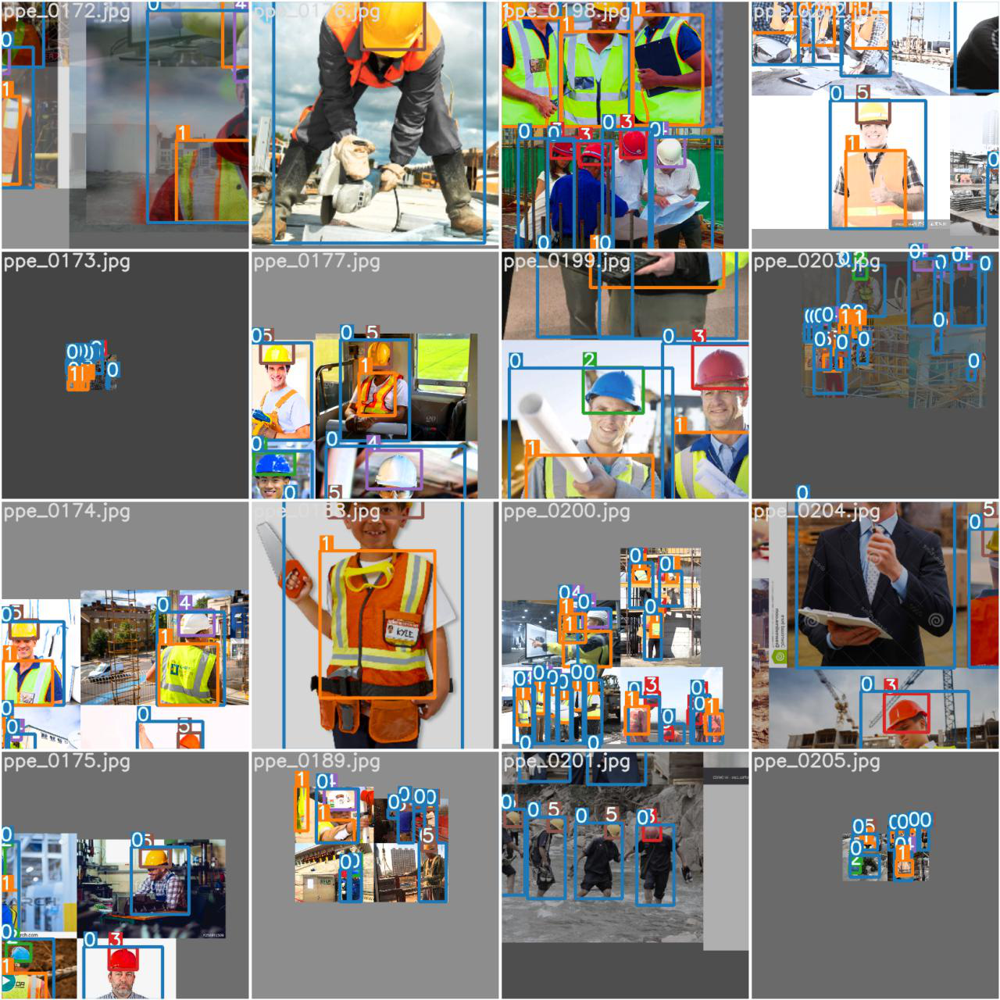

In [ ]:
Image.open("/content/drive/MyDrive/CHV_Data/yolov7/runs/train/yv7_model11/train_batch4.jpg")

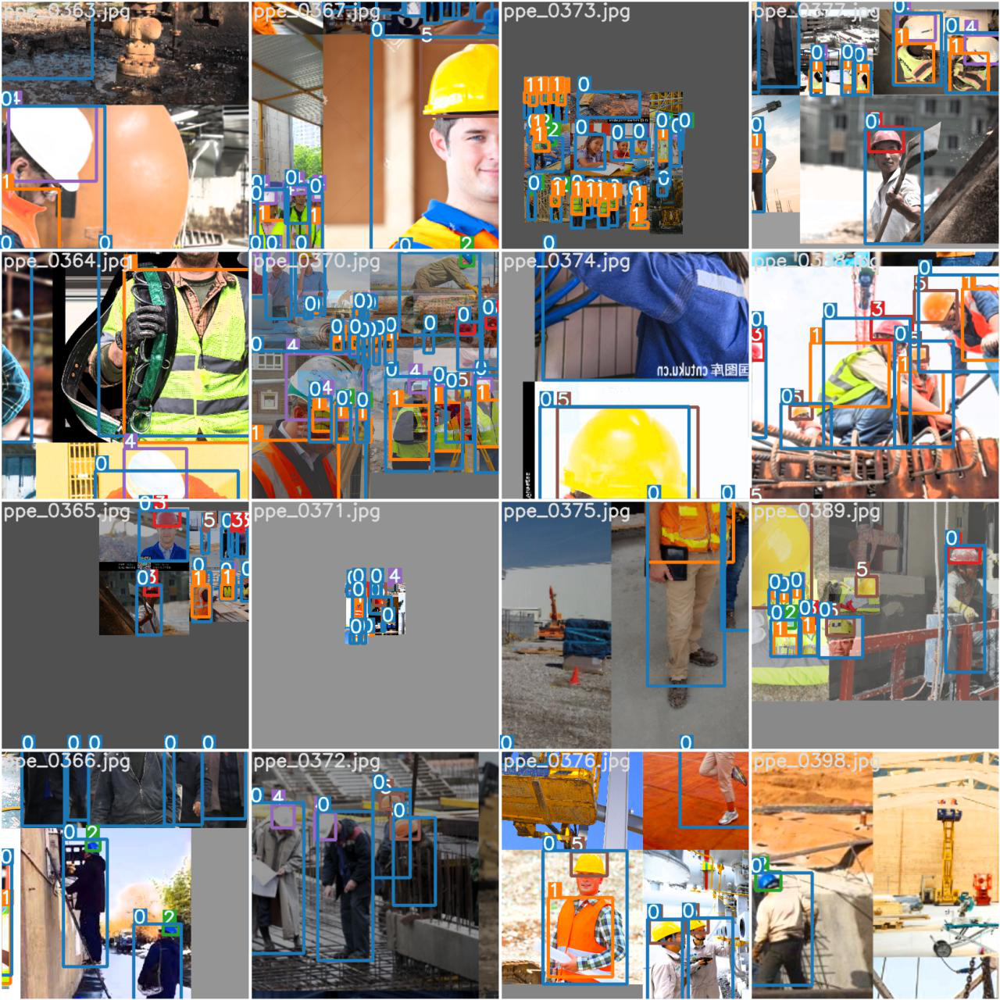

In [ ]:
Image.open("/content/drive/MyDrive/CHV_Data/yolov7/runs/train/yv7_model11/train_batch8.jpg")

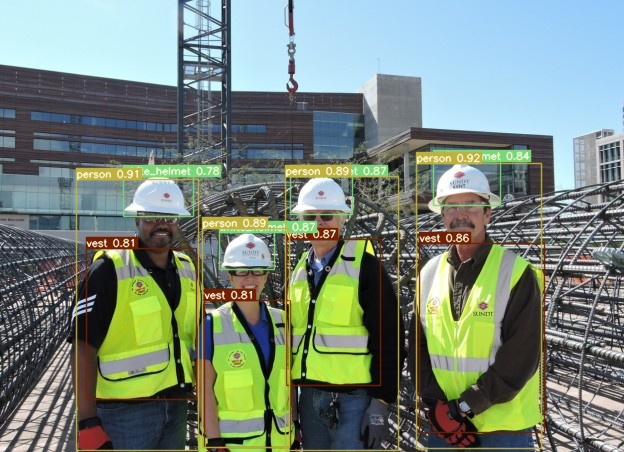

In [ ]:
Image.open("/content/drive/MyDrive/CHV_Data/yolov7/runs/detect/exp/ppe_0353.jpg")

In [ ]:
!python /content/drive/MyDrive/CHV_Data/yolov7/detect.py --weights /content/drive/MyDrive/CHV_Data/yolov7/runs/train/yv7_model11/weights/best.pt --img 640 --source /content/drive/MyDrive/CHV_Data/data/test/images/ppe_0353.jpg

Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.25, device='', exist_ok=False, img_size=640, iou_thres=0.45, name='exp', no_trace=False, nosave=False, project='runs/detect', save_conf=False, save_txt=False, source='/content/drive/MyDrive/CHV_Data/data/test/images/ppe_0353.jpg', update=False, view_img=False, weights=['/content/drive/MyDrive/CHV_Data/yolov7/runs/train/yv7_model11/weights/best.pt'])
YOLOR 🚀 v0.1-115-g072f76c torch 1.12.1+cu113 CUDA:0 (Tesla T4, 15109.75MB)

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
Model Summary: 306 layers, 36506851 parameters, 6194944 gradients
 Convert model to Traced-model... 
 traced_script_module saved! 
 model is traced! 

/usr/local/lib/python3.7/dist-packages/torch/functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2894.)
  return _VF

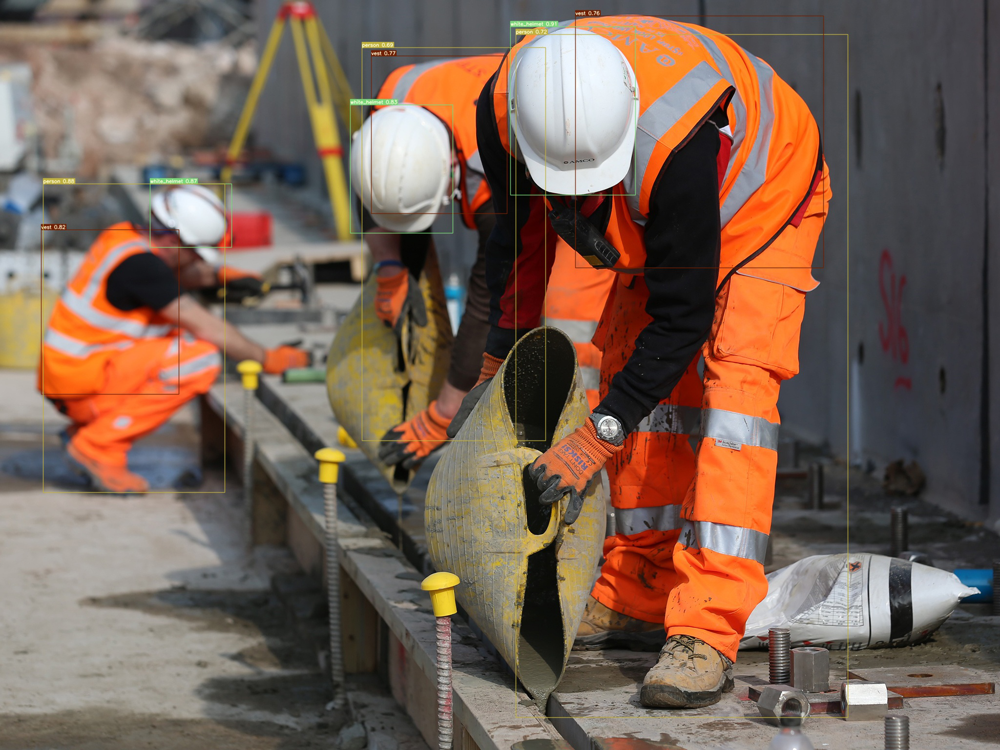

In [ ]:
Image.open("/content/drive/MyDrive/CHV_Data/yolov7/runs/detect/exp/ppe_0344.jpg")

In [ ]:
!python /content/drive/MyDrive/CHV_Data/yolov7/detect.py --weights /content/drive/MyDrive/CHV_Data/yolov7/runs/train/yv7_model11/weights/best.pt --img 640 --source /content/drive/MyDrive/CHV_Data/data/test/images/ppe_0344.jpg

Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.25, device='', exist_ok=False, img_size=640, iou_thres=0.45, name='exp', no_trace=False, nosave=False, project='runs/detect', save_conf=False, save_txt=False, source='/content/drive/MyDrive/CHV_Data/data/test/images/ppe_0344.jpg', update=False, view_img=False, weights=['/content/drive/MyDrive/CHV_Data/yolov7/runs/train/yv7_model11/weights/best.pt'])
YOLOR 🚀 v0.1-115-g072f76c torch 1.12.1+cu113 CUDA:0 (Tesla T4, 15109.75MB)

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
Model Summary: 306 layers, 36506851 parameters, 6194944 gradients
 Convert model to Traced-model... 
 traced_script_module saved! 
 model is traced! 

/usr/local/lib/python3.7/dist-packages/torch/functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2894.)
  return _VF

In [ ]:
!python /content/drive/MyDrive/CHV_Data/yolov7/detect.py --weights /content/drive/MyDrive/CHV_Data/yolov7/runs/train/yv7_model11/weights/best.pt --img 640 --source /content/drive/MyDrive/CHV_Data/data/test/images/ppe_0345.jpg

Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.25, device='', exist_ok=False, img_size=640, iou_thres=0.45, name='exp', no_trace=False, nosave=False, project='runs/detect', save_conf=False, save_txt=False, source='/content/drive/MyDrive/CHV_Data/data/test/images/ppe_0345.jpg', update=False, view_img=False, weights=['/content/drive/MyDrive/CHV_Data/yolov7/runs/train/yv7_model11/weights/best.pt'])
YOLOR 🚀 v0.1-115-g072f76c torch 1.12.1+cu113 CUDA:0 (Tesla T4, 15109.75MB)

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
Model Summary: 306 layers, 36506851 parameters, 6194944 gradients
 Convert model to Traced-model... 
 traced_script_module saved! 
 model is traced! 

/usr/local/lib/python3.7/dist-packages/torch/functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2894.)
  return _VF

In [ ]:
Image.open("/content/drive/MyDrive/CHV_Data/yolov7/runs/detect/exp46/ppe_0569.jpg")

In [ ]:
!python /content/drive/MyDrive/CHV_Data/yolov7/detect.py --weights /content/drive/MyDrive/CHV_Data/yolov7/runs/train/yv7_model11/weights/best.pt --img 640 --source /content/drive/MyDrive/CHV_Data/data/test/images/ppe_0569.jpg

Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.25, device='', exist_ok=False, img_size=640, iou_thres=0.45, name='exp', no_trace=False, nosave=False, project='runs/detect', save_conf=False, save_txt=False, source='/content/drive/MyDrive/CHV_Data/data/test/images/ppe_0569.jpg', update=False, view_img=False, weights=['/content/drive/MyDrive/CHV_Data/yolov7/runs/train/yv7_model11/weights/best.pt'])
YOLOR 🚀 v0.1-115-g072f76c torch 1.12.1+cu113 CUDA:0 (Tesla T4, 15109.75MB)

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
Model Summary: 306 layers, 36506851 parameters, 6194944 gradients
 Convert model to Traced-model... 
 traced_script_module saved! 
 model is traced! 

/usr/local/lib/python3.7/dist-packages/torch/functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2894.)
  return _VF

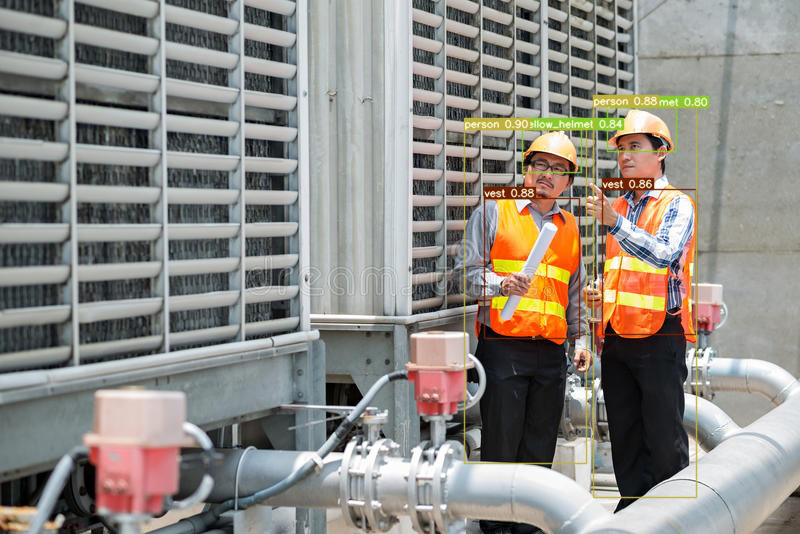

In [ ]:

Image.open("/content/drive/MyDrive/CHV_Data/yolov7/runs/detect/exp/ppe_0122.jpg")

In [ ]:
!python /content/drive/MyDrive/CHV_Data/yolov7/detect.py --weights /content/drive/MyDrive/CHV_Data/yolov7/runs/train/yv7_model11/weights/best.pt --img 640 --source /content/drive/MyDrive/CHV_Data/data/test/images/ppe_0122.jpg

Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.25, device='', exist_ok=False, img_size=640, iou_thres=0.45, name='exp', no_trace=False, nosave=False, project='runs/detect', save_conf=False, save_txt=False, source='/content/drive/MyDrive/CHV_Data/data/test/images/ppe_0122.jpg', update=False, view_img=False, weights=['/content/drive/MyDrive/CHV_Data/yolov7/runs/train/yv7_model11/weights/best.pt'])
YOLOR 🚀 v0.1-115-g072f76c torch 1.12.1+cu113 CUDA:0 (Tesla T4, 15109.75MB)

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
Model Summary: 306 layers, 36506851 parameters, 6194944 gradients
 Convert model to Traced-model... 
 traced_script_module saved! 
 model is traced! 

/usr/local/lib/python3.7/dist-packages/torch/functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2894.)
  return _VF

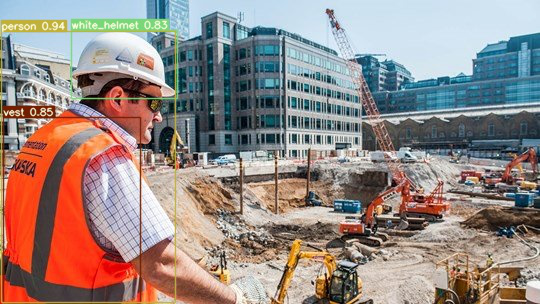

In [ ]:
Image.open("/content/drive/MyDrive/CHV_Data/yolov7/runs/detect/exp/ppe_0031.jpg")

In [ ]:

!python /content/drive/MyDrive/CHV_Data/yolov7/detect.py --weights /content/drive/MyDrive/CHV_Data/yolov7/runs/train/yv7_model11/weights/best.pt --img 416 --source /content/drive/MyDrive/CHV_Data/cwv.mp4


Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.25, device='', exist_ok=False, img_size=416, iou_thres=0.45, name='exp', no_trace=False, nosave=False, project='runs/detect', save_conf=False, save_txt=False, source='/content/drive/MyDrive/CHV_Data/cwv.mp4', update=False, view_img=False, weights=['/content/drive/MyDrive/CHV_Data/yolov7/runs/train/yv7_model11/weights/best.pt'])
YOLOR 🚀 v0.1-115-g072f76c torch 1.12.1+cu113 CUDA:0 (Tesla T4, 15109.75MB)

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
Model Summary: 306 layers, 36506851 parameters, 6194944 gradients
 Convert model to Traced-model... 
 traced_script_module saved! 
 model is traced! 

/usr/local/lib/python3.7/dist-packages/torch/functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2894.)
  return _VF.meshgrid(tensors, **k